
# <center> Preparação e Classificação não supervisionada da grade celular </center>

<br/>

<div style="text-align: center;font-size: 90%;">
    Bruno Dias dos Santos<sup><a href="https://orcid.org/0000-0001-6181-2158"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup><sup><a href="https://orcid.org/0000-0002-0082-9498"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/><br/>
    Programa de Pós-Graduação em Computação Aplicada, Instituto Nacional de Pesquisas Espaciais (INPE)
    <br/>
    Avenida dos Astronautas, 1758, Jardim da Granja, São José dos Campos, SP 12227-010, Brasil
    <br/><br/>
    Contato: <div><a href="mailto:bruno.santos@inpe.br">bruno.santos@inpe.br</a></div>
    <br/><br/>
    Última atualização: 18 de Abril de 2022
</div>
<br/>

<div style="text-align: justify;  margin-left: 25%; margin-right: 25%;">
<b>Resumo.</b>  Este Notebook apresenta uma metodologia para tratar variáveis e posterior classificação não supervisionada  algoritmo <i> Agglomerative Clustering </i>. Dado uma tabela de arquivo shapefile (.shp) os atributos serão tratados a partir do preenchimento de valores faltantes e normalizados. Posteriormente, serão construidos modelos com o algoritmo não supervisionado.
</div>    

<br/>

### 1º Etapa: Tratamento e seleção de variáveis

Importação das bibliotecas:

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import shapely
import folium
import mapclassify
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans, SpectralClustering, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn_som.som import SOM
from kmodes.kmodes import KModes

Leitura do shapefile e criação de um GeoDataFrame:

In [31]:
amb = gpd.read_file("D:\\00_INPE\\0_DISSERTACAO\\0_BASE_VETOR\\AMBIENTAL\\clusters_ambiental.shp")

In [32]:
amb

,ID,SN [MEAN],VN [MEAN],HND [MEAN],CA_AG,CA_SE,CA_VA,CA_VH,PD_VH,HC_6,SOM_23_6,geometry
0,1,-0.042412,0.803095,0.226024,-0.419488,-0.317700,0.859526,-0.679427,-0.829113,0,5,"POLYGON ((752288.177 9722818.283, 752288.612 9..."
1,2,0.385147,0.643596,-0.062881,-0.419488,-0.317700,0.849556,-0.679427,-0.829113,0,5,"POLYGON ((752388.360 9722817.848, 752388.795 9..."
2,3,0.768742,-0.268456,-0.468527,-0.419488,-0.317700,0.839590,-0.679427,-0.829113,0,5,"POLYGON ((752488.544 9722817.414, 752488.978 9..."
3,4,0.172079,-0.624968,-0.591165,-0.419488,-0.317700,0.829631,-0.679427,-0.829113,0,5,"POLYGON ((752588.727 9722816.980, 752589.162 9..."
4,5,-0.120413,-1.357845,-0.610032,-0.419488,0.341111,0.230008,-0.520606,-0.106338,0,5,"POLYGON ((752688.911 9722816.546, 752689.345 9..."
...,...,...,...,...,...,...,...,...,...,...,...,...
13616,14651,-0.716772,0.176632,-0.718519,2.593800,-0.317700,-1.022291,-0.679427,-0.829113,5,2,"POLYGON ((752435.786 9733807.561, 752436.214 9..."
13617,14652,-0.875411,-0.133771,-0.817572,2.593803,-0.317700,-1.022291,-0.679427,-0.829113,5,2,"POLYGON ((752535.942 9733807.133, 752536.369 9..."
13618,14653,-0.975081,-0.078249,-0.817572,2.593807,-0.317700,-1.022291,-0.679427,-0.829113,5,2,"POLYGON ((752636.097 9733806.706, 752636.525 9..."
13619,14654,-0.852918,-0.007978,-0.753895,2.593811,-0.317700,-1.022291,-0.679427,-0.829113,5,2,"POLYGON ((752736.253 9733806.280, 752736.680 9..."


In [33]:
urb = gpd.read_file("D:\\00_INPE\\0_DISSERTACAO\\0_BASE_VETOR\\MORFOLOGIA\\clusters_morfo_v3_final.shp")

In [34]:
urb

,ID,C1_ang_con,C1_ch_max,C1_lch5KM,C3_CA_CE,C3_CA_BR,C3_CA_FI,C4_DATA,C2_AP_MEAN,C5_MEAN,C6_CA_ES,C7_ASM_MAX,KM_7,HC_7,SOM_1_7,geometry
0,5,-0.904887,7.657204,-0.565578,-0.182688,0.663551,-0.481669,-0.877458,0.668951,-1.259123,-0.947576,0.258129,4,0,5,"POLYGON ((752688.911 9722816.546, 752689.345 9..."
1,6,-0.904887,7.657204,-0.567691,-0.273534,-0.372702,-0.737791,-0.877458,0.694571,-1.259110,-0.947576,-1.118395,4,0,5,"POLYGON ((752789.095 9722816.113, 752789.529 9..."
2,10,-0.559015,-0.268752,-0.569704,-0.479358,-0.372702,-0.539551,-0.877458,0.747435,-1.259050,-0.947576,-0.237737,2,1,3,"POLYGON ((753189.831 9722814.381, 753190.263 9..."
3,11,-0.559015,-0.269892,-0.569805,-0.479358,-0.372702,-0.760743,-0.877458,0.727739,-1.259021,-0.947576,2.392334,6,1,3,"POLYGON ((753290.015 9722813.949, 753290.447 9..."
4,12,-0.586183,-0.270104,-0.569703,-0.479358,-0.372702,-0.356658,-0.877458,0.735039,-1.259008,-0.947576,1.261760,6,1,3,"POLYGON ((753390.199 9722813.517, 753390.631 9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,1.016402,-0.267912,-0.569805,-0.479358,-0.340505,-0.704990,-1.437618,-1.033767,-1.181086,-0.947576,-0.237737,6,1,3,"POLYGON ((751430.790 9733012.497, 751431.221 9..."
6297,14339,1.023387,-0.270266,-0.569805,-0.479358,-0.372702,-0.171943,-1.507638,-1.026069,-0.976498,-0.947576,1.261760,6,1,3,"POLYGON ((751530.947 9733012.067, 751531.377 9..."
6298,14340,1.023387,-0.270266,-0.569805,-0.479358,-0.372702,-0.798713,-1.507638,-1.038590,-1.286691,-0.947576,-0.063192,6,1,3,"POLYGON ((751631.104 9733011.636, 751631.534 9..."
6299,14392,-0.913516,-0.270334,-0.569805,-0.479358,1.051430,-0.802306,-1.507638,-0.998392,-1.049142,-0.947576,0.400938,6,1,3,"POLYGON ((751230.907 9733113.276, 751231.338 9..."


In [41]:
soc = gpd.read_file("D:\\00_INPE\\0_DISSERTACAO\\0_BASE_VETOR\\SOCIOECONOMICO\\TESTE\\cluster_socioeconomicos.shp")

In [42]:
soc

,ID,avg_inv_ho,p_per_hous,dr_15,dr_65,sex_ratio,literacy,inad_sewag,inad_water,inap_waste,HC_6,geometry
0,5,4.410572,-2.005001,-0.630414,-2.212782,1.294842,0.912436,-1.586697,3.868941,-0.657175,4,"POLYGON ((752688.911 9722816.546, 752689.345 9..."
1,6,4.410601,-2.004980,-0.630408,-2.212782,1.294868,0.912469,-1.586696,3.868964,-0.657175,4,"POLYGON ((752789.095 9722816.113, 752789.529 9..."
2,10,4.410723,-2.004895,-0.630384,-2.212782,1.294975,0.912602,-1.586694,3.869060,-0.657175,4,"POLYGON ((753189.831 9722814.381, 753190.263 9..."
3,11,4.410754,-2.004873,-0.630378,-2.212782,1.295002,0.912635,-1.586693,3.869085,-0.657175,4,"POLYGON ((753290.015 9722813.949, 753290.447 9..."
4,12,4.410785,-2.004852,-0.630372,-2.212782,1.295030,0.912670,-1.586693,3.869109,-0.657175,4,"POLYGON ((753390.199 9722813.517, 753390.631 9..."
...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,-0.826077,0.264537,0.489679,1.809134,1.405008,-0.118153,1.059443,3.652556,1.775416,4,"POLYGON ((751430.790 9733012.497, 751431.221 9..."
6297,14339,-0.826077,0.264537,0.489679,1.809134,1.405008,-0.118153,1.059443,3.652556,1.775416,4,"POLYGON ((751530.947 9733012.067, 751531.377 9..."
6298,14340,-0.826077,0.264537,0.489679,1.809134,1.405008,-0.118153,1.059443,3.652556,1.775416,4,"POLYGON ((751631.104 9733011.636, 751631.534 9..."
6299,14392,-0.826077,0.264537,0.489679,1.809134,1.405008,-0.118153,1.059443,3.652556,1.775416,4,"POLYGON ((751230.907 9733113.276, 751231.338 9..."


In [35]:
amb = amb[['ID','HC_6', 'geometry']]

In [36]:
urb = urb[['ID', 'HC_7','geometry']]

In [43]:
soc = soc[['ID', 'HC_6', 'geometry' ]]

Definicação da variável identificadora de cada feição:

In [44]:
indice = 'ID'

Criando uma base de dados que será utilizada na saída, copiando as informações do 'indice' e o 'TARGET' da base original:

In [50]:
geom = (urb.merge(amb[['ID', 'HC_6']], left_on=indice, right_on=indice, how='left')).merge(soc[['ID', 'HC_6']], left_on=indice, right_on=indice, how='left')

In [51]:
geom

,ID,HC_7,geometry,HC_6_x,HC_6_y
0,5,0,"POLYGON ((752688.911 9722816.546, 752689.345 9...",0,4
1,6,0,"POLYGON ((752789.095 9722816.113, 752789.529 9...",2,4
2,10,1,"POLYGON ((753189.831 9722814.381, 753190.263 9...",1,4
3,11,1,"POLYGON ((753290.015 9722813.949, 753290.447 9...",1,4
4,12,1,"POLYGON ((753390.199 9722813.517, 753390.631 9...",0,4
...,...,...,...,...,...
6296,14338,1,"POLYGON ((751430.790 9733012.497, 751431.221 9...",5,4
6297,14339,1,"POLYGON ((751530.947 9733012.067, 751531.377 9...",5,4
6298,14340,1,"POLYGON ((751631.104 9733011.636, 751631.534 9...",5,4
6299,14392,1,"POLYGON ((751230.907 9733113.276, 751231.338 9...",5,4


In [52]:
geom.columns

Index(['ID', 'HC_7', 'geometry', 'HC_6_x', 'HC_6_y'], dtype='object')

In [53]:
geom = geom[['ID', 'HC_7', 'HC_6_x', 'HC_6_y', 'geometry' ]]

In [55]:
geom.columns = ['ID', 'URB', 'AMB', 'SOC', 'geometry']
geom

,ID,URB,AMB,SOC,geometry
0,5,0,0,4,"POLYGON ((752688.911 9722816.546, 752689.345 9..."
1,6,0,2,4,"POLYGON ((752789.095 9722816.113, 752789.529 9..."
2,10,1,1,4,"POLYGON ((753189.831 9722814.381, 753190.263 9..."
3,11,1,1,4,"POLYGON ((753290.015 9722813.949, 753290.447 9..."
4,12,1,0,4,"POLYGON ((753390.199 9722813.517, 753390.631 9..."
...,...,...,...,...,...
6296,14338,1,5,4,"POLYGON ((751430.790 9733012.497, 751431.221 9..."
6297,14339,1,5,4,"POLYGON ((751530.947 9733012.067, 751531.377 9..."
6298,14340,1,5,4,"POLYGON ((751631.104 9733011.636, 751631.534 9..."
6299,14392,1,5,4,"POLYGON ((751230.907 9733113.276, 751231.338 9..."


In [57]:
geom.explore(column="AMB", tooltip="AMB",tiles='cartodbpositron',
             categorical = True, style_kwds=dict(color="grey", weight=0.01, fillOpacity = 0.7))

In [59]:
geom['AMB'].replace(3, 
           1, 
           inplace=True)

geom['AMB'].replace(4, 
           1, 
           inplace=True)

geom['AMB'].replace(0, 
           1, 
           inplace=True)

C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\3556315934.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['AMB'].replace(3,
C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\3556315934.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['AMB'].replace(4,
C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\3556315934.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['AMB'].replace(0,


<AxesSubplot:>

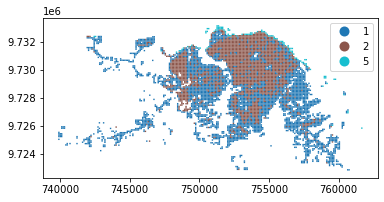

In [60]:
geom.plot(column= geom['AMB'], cmap='tab10',legend=True, categorical=True)

In [61]:
geom.explore(column="URB", tooltip="URB",tiles='cartodbpositron',
             categorical = True, style_kwds=dict(color="grey", weight=0.01, fillOpacity = 0.7))

In [62]:
geom['URB'].replace(6, 
           2, 
           inplace=True)

geom['URB'].replace(5, 
           1, 
           inplace=True)

C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\906767505.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['URB'].replace(6,
C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\906767505.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['URB'].replace(5,


<AxesSubplot:>

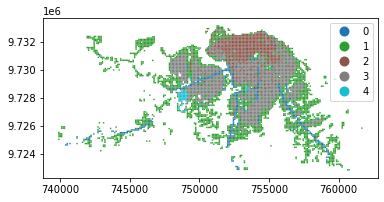

In [63]:
geom.plot(column= geom['URB'], legend=True, categorical=True)

In [64]:
geom.explore(column="SOC", tooltip="SOC",tiles='cartodbpositron',
             categorical = True, style_kwds=dict(color="grey", weight=0.01, fillOpacity = 0.7))

In [65]:
geom['SOC'].replace(1, 
           0, 
           inplace=True)

geom['SOC'].replace(2, 
           0, 
           inplace=True)

C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\450902375.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['SOC'].replace(1,
C:\Users\brdia\AppData\Local\Temp\ipykernel_21152\450902375.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['SOC'].replace(2,


<AxesSubplot:>

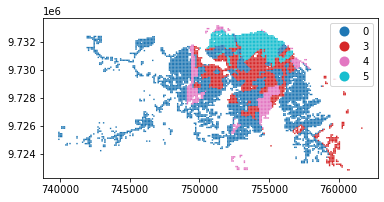

In [66]:
geom.plot(column= geom['SOC'], legend=True, categorical=True)

In [67]:
geom.isna().any()

ID          False
URB         False
AMB         False
SOC         False
geometry    False
dtype: bool

### 2º Etapa: Classificação Não Supervisionada da Grade Celular

Criando uma base de dados com as variáveis para o processo de classificação não supervisionada:

In [68]:
dados = geom.iloc[:,1:-1].to_numpy()
dados

array([[0, 1, 4],
       [0, 2, 4],
       [1, 1, 4],
       ...,
       [1, 5, 4],
       [1, 5, 4],
       [1, 5, 4]], dtype=int64)

Gerando um gráfico de <i>dendrograma</i> para identificar um bom número de cluster no modelo <b>AC</b>:

In [69]:
km = KModes(n_clusters=10, init='Huang', n_init=300, verbose=1)
km.fit_predict(dados)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 574, cost: 1695.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 2298.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 405, cost: 1688.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 638, cost: 2524.0
Run 4, iteration: 2/100, moves: 7, cost: 2524.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 1243, cost: 1694.0
Run 5, iteration: 2/100, moves: 0, cost: 1694.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 6, iteration: 1/100, moves: 51, cost: 2143.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 7, iteration: 1/100, moves: 468, cost: 220

Starting iterations...
Run 56, iteration: 1/100, moves: 405, cost: 2018.0
Run 56, iteration: 2/100, moves: 714, cost: 1756.0
Run 56, iteration: 3/100, moves: 15, cost: 1756.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 57, iteration: 1/100, moves: 215, cost: 1839.0
Run 57, iteration: 2/100, moves: 10, cost: 1839.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 58, iteration: 1/100, moves: 0, cost: 2356.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 59, iteration: 1/100, moves: 299, cost: 1595.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 60, iteration: 1/100, moves: 268, cost: 1695.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 61, iteration: 1/100, moves: 1339, cost: 1665.0
Run 61, iteration: 2/100, moves: 9, cost: 1665.0
Init: initializing centroids
Init: initializing clusters
Starting iterat

Init: initializing clusters
Starting iterations...
Run 111, iteration: 1/100, moves: 814, cost: 1610.0
Run 111, iteration: 2/100, moves: 79, cost: 1610.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 112, iteration: 1/100, moves: 18, cost: 2701.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 113, iteration: 1/100, moves: 774, cost: 1864.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 114, iteration: 1/100, moves: 13, cost: 2313.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 115, iteration: 1/100, moves: 1187, cost: 1710.0
Run 115, iteration: 2/100, moves: 144, cost: 1710.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 116, iteration: 1/100, moves: 390, cost: 2311.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 117, iteration: 1/100, moves: 536, cost: 1602.0
Ini

Init: initializing clusters
Starting iterations...
Run 165, iteration: 1/100, moves: 52, cost: 1505.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 166, iteration: 1/100, moves: 204, cost: 2245.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 167, iteration: 1/100, moves: 1256, cost: 1769.0
Run 167, iteration: 2/100, moves: 29, cost: 1769.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 168, iteration: 1/100, moves: 759, cost: 1520.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 169, iteration: 1/100, moves: 398, cost: 1728.0
Run 169, iteration: 2/100, moves: 0, cost: 1728.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 170, iteration: 1/100, moves: 98, cost: 2098.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 171, iteration: 1/100, moves: 396, cost: 1868.0
Init:

Starting iterations...
Run 220, iteration: 1/100, moves: 560, cost: 1966.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 221, iteration: 1/100, moves: 988, cost: 1563.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 222, iteration: 1/100, moves: 8, cost: 2201.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 223, iteration: 1/100, moves: 291, cost: 1569.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 224, iteration: 1/100, moves: 1033, cost: 2144.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 225, iteration: 1/100, moves: 0, cost: 2298.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 226, iteration: 1/100, moves: 593, cost: 2053.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 227, iteration: 1/100, moves: 0, cost: 2071.0
Init: 

Starting iterations...
Run 275, iteration: 1/100, moves: 800, cost: 2114.0
Run 275, iteration: 2/100, moves: 571, cost: 2076.0
Run 275, iteration: 3/100, moves: 23, cost: 2076.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 276, iteration: 1/100, moves: 236, cost: 1783.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 277, iteration: 1/100, moves: 336, cost: 1765.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 278, iteration: 1/100, moves: 679, cost: 1529.0
Run 278, iteration: 2/100, moves: 15, cost: 1529.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 279, iteration: 1/100, moves: 8, cost: 1987.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 280, iteration: 1/100, moves: 370, cost: 1823.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 281, iteration: 1/100, moves:

array([3, 0, 1, ..., 1, 1, 1], dtype=uint16)

Visualizando a quantidade de feições em cada cluster:

In [70]:
unique, counts = np.unique(km.labels_, return_counts=True)

result = np.column_stack((unique, counts)) 
print (result)

[[   0  954]
 [   1  672]
 [   2  488]
 [   3  254]
 [   4  308]
 [   5 1875]
 [   6  192]
 [   7  452]
 [   8  589]
 [   9  517]]


Incluindo o resultado do modelo <b>AC</b> na base de dados:

In [71]:
geom['usep_10'] = km.labels_

C:\Users\brdia\AppData\Roaming\Python\Python39\site-packages\geopandas\geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Visualizando um mapa simples com os clusters do modelo <b>AC</b>:

<AxesSubplot:>

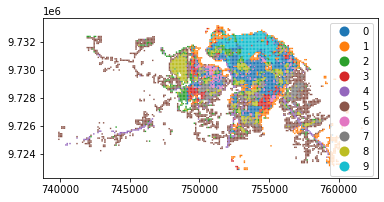

In [72]:
geom.plot(column= geom['usep_10'], legend=True, categorical=True)

Visualizando a base de dados e exportando uma chamada shapefile com as informações:

In [213]:
geom

,ID,HC_6,HC_7,geometry,MODES_10
0,5,1,0,"POLYGON ((752688.911 9722816.546, 752689.345 9...",4
1,6,2,0,"POLYGON ((752789.095 9722816.113, 752789.529 9...",3
2,10,1,1,"POLYGON ((753189.831 9722814.381, 753190.263 9...",0
3,11,1,1,"POLYGON ((753290.015 9722813.949, 753290.447 9...",0
4,12,1,1,"POLYGON ((753390.199 9722813.517, 753390.631 9...",0
...,...,...,...,...,...
6296,14338,5,1,"POLYGON ((751430.790 9733012.497, 751431.221 9...",2
6297,14339,5,1,"POLYGON ((751530.947 9733012.067, 751531.377 9...",2
6298,14340,5,1,"POLYGON ((751631.104 9733011.636, 751631.534 9...",2
6299,14392,5,1,"POLYGON ((751230.907 9733113.276, 751231.338 9...",2


In [73]:
geom.explore(column="usep_10", tooltip="usep_10",tiles='cartodbpositron',
             categorical = True, style_kwds=dict(color="grey", weight=0.01, fillOpacity = 0.7))

In [223]:
unique, counts = np.unique(geom['MODES_10'], return_counts=True)

result = np.column_stack((unique, counts)) 
print (result)

[[   0 2673]
 [   1  995]
 [   2  120]
 [   3  420]
 [   5  729]
 [   6   73]
 [   8 1291]]


In [221]:
geom['MODES_10'].replace(4, 
           3, 
           inplace=True)

geom['MODES_10'].replace(9, 
           0, 
           inplace=True)

geom['MODES_10'].replace(7, 
           1, 
           inplace=True)

C:\Users\brdia\AppData\Local\Temp\ipykernel_4472\779261506.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['MODES_10'].replace(4,
C:\Users\brdia\AppData\Local\Temp\ipykernel_4472\779261506.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['MODES_10'].replace(9,
C:\Users\brdia\AppData\Local\Temp\ipykernel_4472\779261506.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom['MODES_10'].replace(7,


In [220]:
geom.to_file("D:\\00_INPE\\0_DISSERTACAO\\0_BASE_VETOR\\UMARS\\clusters_UMARS_santarem.shp")